In [1]:
import numpy as np # library for data structures, vectors, matrices and mathematical functions
import matplotlib.pyplot as plt                   # library for plotting and visual representation
import matplotlib.transforms as transform                   # library for plotting and visual representation
from matplotlib import rcParams                   # module handling generic plot parameters
from matplotlib.ticker import (FormatStrFormatter)# module for figure axis formatting
import pandas as pd                               # data administration, here used for data import
from scipy.optimize import curve_fit              # fitting algorithm from the scipy package
from IPython.display import display as dy, Markdown as md, Latex as Lx, Image as Im, HTML as hm # displaying LaTeX code in code cells

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

plt.rcParams.update({'font.size': 12,
                     'axes.titlesize': 18,
                     'axes.labelsize': 16,
                     'axes.labelpad': 14,
                     'lines.linewidth': 1,
                     'lines.markersize': 15,
                     'xtick.labelsize' : 16,
                     'ytick.labelsize' : 16,
                     'xtick.top' : True,
                     'xtick.direction' : 'in',
                     'ytick.right' : True,
                     'ytick.direction' : 'in',
                     'figure.figsize': (10,6),
                    })

plt.rcParams['axes.facecolor'] = 'black' 
plt.rcParams['axes.labelcolor'] = 'white'
plt.rcParams['axes.titlecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'black'
plt.rcParams['xtick.labelcolor'] = 'white'
plt.rcParams['ytick.labelcolor'] = 'white'
plt.rcParams['legend.labelcolor'] = 'white'
plt.rcParams['grid.color'] = '#707070'
plt.rcParams['axes.titlepad'] = 20
legendfontsize=12

ip = get_ipython()
ibe = ip.configurables[-1]
ibe.figure_formats = { 'pdf', 'png'}

# Switching Phenomena

Group #13

NG Kuok Fung | #3797903 

Edgar Harutyunyan | #3775171

**Overview of Tasks**

***Task 1***

Measure the voltage drop across a capacitor ($500 ~pF < C < 10 ~nF$), which is discharged through a resistor with an as small as possible rating.


***Task 2***

Develop a model for your observations.

***Task 3***

Perform further measurements to test the model. Analyze the data quantitatively.

***Task 4***

When do you observe a time constant $\tau =RC$? Make at least one measurement in this regime.

In [2]:
# GLOBALS
U_0 = 5 # V
u_R_factor = 0.05 #

## Task 1

### Measure the voltage drop across a capacitor in a Mosfet Switch Circuit

***Task Definition*** 

The goal of task 1 is to set up a MOSFET- switch circuit and measure the voltage drop across the capacitor as it discharges through a resistor with the smallest possible rating. The collected data is then fitted to a model equation and used to determine the capacitance $C$.

***Theoretical Basis*** 

The following model equation is used to fit the data. It describes how voltage $U_c$ varies across a capacitor as it discharges over time $t$:

$$ U_c = U_0 \exp \left( -\frac{t}{RC} \right)$$

$$ \frac{U_c}{U_0}= \exp \left( -\frac{t}{RC} \right) \label{eq1.1} \tag{1.1} $$

- $U_c$ :  Voltage across capacitor at a given time $t$

- $U_0$ : Maximum voltage across capacitor 

- $R$ : Resistance of discharge resistor 

- $C$ : Capacitance


[Eq 1.1](#mjx-eqn-eq1.1) may be manipulated to yield the following linear relationship:

$$ \ln (\frac{U_c}{U_0} ) = kt$$

$$k = -\frac{1}{RC}$$

$$C = -\frac{1}{Rk}\label{eq1.2} \tag{1.2}$$

Hence, the uncertainty in $C$ is given by:

$$\mu_C = \sqrt{\left(\frac{\partial C}{\partial k}\mu_k\right)^2 + \left(\frac{\partial C}{\partial R}\mu_R\right)^2}$$

- $\mu_{k}$ : Uncertainty of k from linear fit.

***Procedure***

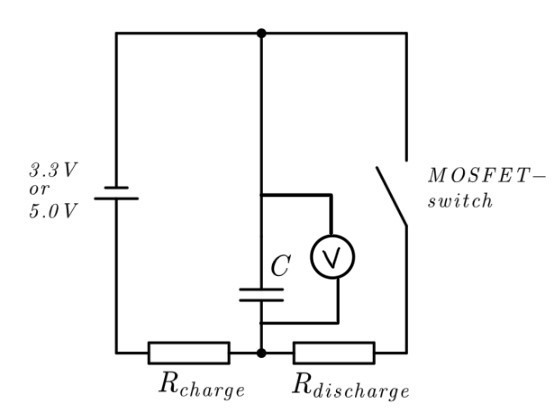

<IPython.core.display.Latex object>

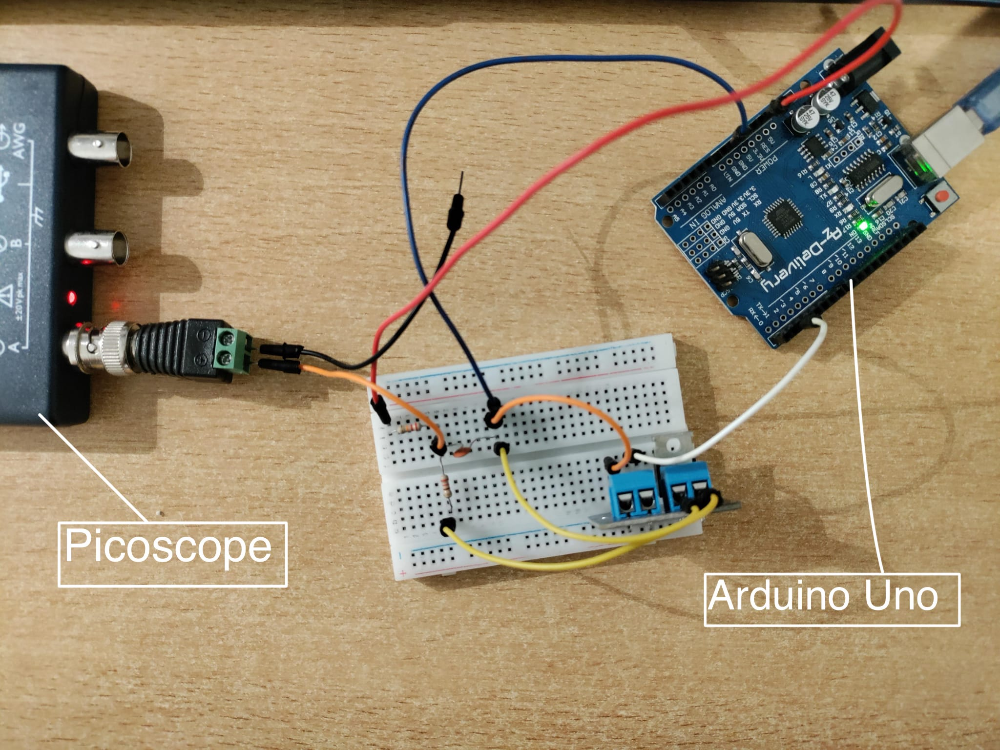

<IPython.core.display.Latex object>

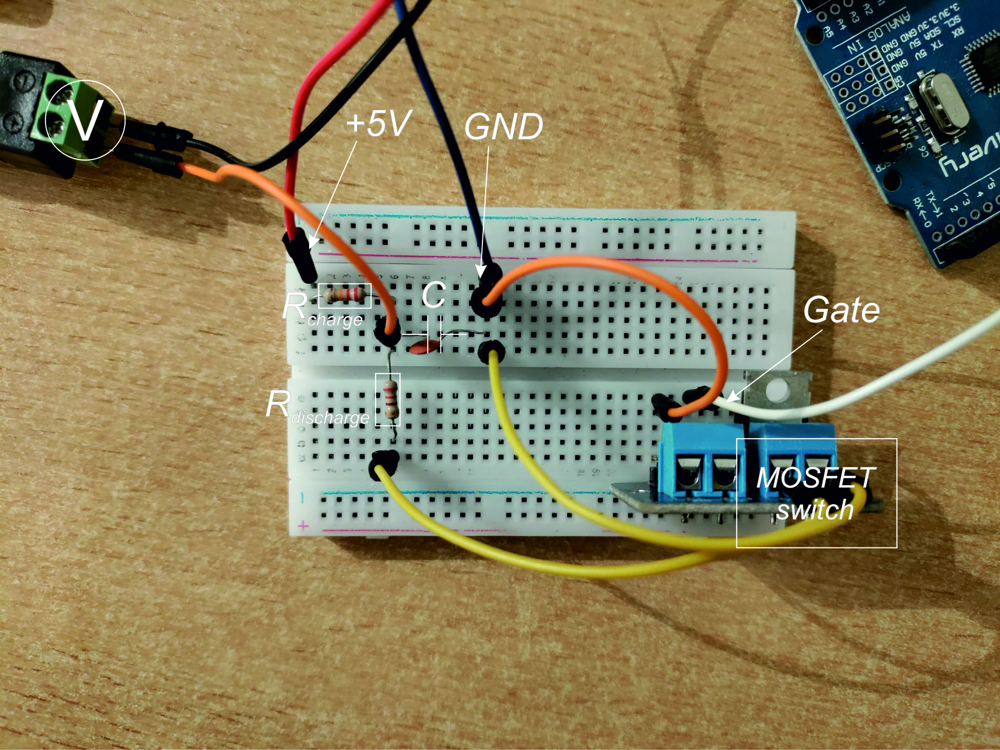

<IPython.core.display.Latex object>

In [3]:
dy(Im("./img/Mosfet.jpg", height=100, width=400))
dy(Lx(r'$Figure\, 1.1$: MOSFET Switch Circuit Diagram'))

dy(Im("./img/C1.jpg", height=100, width=500))
dy(Lx(r'$Figure\, 1.2$: MOSFET Switch Circuit Set-Up'))

dy(Im("./img/C2.jpg", height=100, width=500))
dy(Lx(r'$Figure\, 1.3$: MOSFET Switch Circuit Closeup'))

1. The circuit was set up following the circuit diagram **Fig 1.1**.
<br>

2. The Arduino Uno provided the 5V DC source used to charge the capacitor, and to operate the MOSFET switch, while the PicoScope functioned as the voltmeter. **Fig 1.2**
<br>

3. A $22 ~k\Omega$ and $10 ~\Omega$ resistor was used as $R_{charge}$ and $R_{discharge}$ respectively **Fig 1.3**. The purpose of using a high resistance value for $R_{charge}$ was to impede the flow of current back into the power source during capacitor discharge. 
<br>

4. Measurements of the voltage across the capacitor ($U_c$) as a function of time ($t$) were recorded using [PicoScope 7 software](https://www.picotech.com/products/picoscope-7-software) installed on a host connected to the PicoScope 2000.
<br>

5. Vary $R_{discharge}$ and repeat the the steps above.

In [4]:
# Data Preprocessing
import os
import re
data_dir='./data/'
data_count = 0
R_l = []
data_dir_l = []
unit_mask=[]
R_str_l = []
R_init_l = []

for path in os.listdir(data_dir):
    tmp_path = os.path.join(data_dir, path)
    if os.path.isdir(tmp_path):
        data_dir_l.append(tmp_path)
        r = int(''.join(re.findall(r'\d+', path)))
        R_init_l.append(r)
        if 'k' in path:
            r = r * 1000
            R_str_l.append("k\Omega")
        else:
            R_str_l.append("\Omega")
        R_l.append(r)

sorted_lists = sorted(zip(R_l, R_str_l, R_init_l, data_dir_l))
R_l, R_str_l, R_init_l, data_dir_l = zip(*sorted_lists)

data_set = {}
avg_l = [] 
for i in range(len(data_dir_l)): # Averaging
    df_l = []
    data_set[R_l[i]] = df_l
    unit_mask_i = ''
    for path in os.listdir(data_dir_l[i]): # per R
        tmp_path = os.path.join(data_dir_l[i], path)
        if os.path.isfile(tmp_path):
            df = pd.read_csv(tmp_path, delimiter=';', skiprows=1, dtype=np.float64, decimal=',')
            df.columns = ['Time', 'Voltage']
            df_units = pd.read_csv(tmp_path, delimiter=';', nrows=1)
            unit_mask_i = ''.join(re.findall(r'\w+', df_units['Time'][0]))
            df_l.append(df)
    unit_mask.append(unit_mask_i)
    avg_l.append([np.array(sum(df['Time'] for df in df_l) / len(df_l)),\
                  np.array(sum(df['Voltage'] for df in df_l) / len(df_l))])

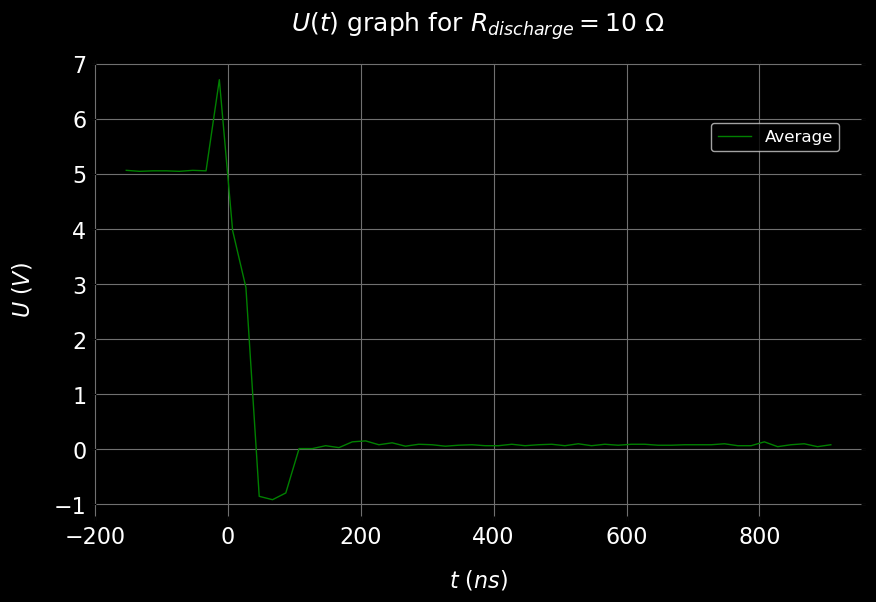

<IPython.core.display.Latex object>

In [5]:
c = 0
for k in data_set:
    if(unit_mask[c] == 'us'): 
        unit_str = '\\mu s'
    else:
        unit_str = 'ns'
    if k == 10:
        #for v in range(len(data_set[k])):
            #print(data_set[k][v])
            #for i in range(len(v)):
            #plt.plot(data_set[k][v]['Time'], data_set[k][v]['Voltage'], '--')
            #plt.show()
        plt.title(r"$U(t)$ graph for $R_{discharge} = %d ~%s$ " % (R_init_l[c], R_str_l[c]))
        plt.xlabel('$t$ ($%s$)' % unit_str)
        plt.ylabel('$U$ ($V$)')
        plt.grid(True)
        plt.plot(avg_l[c][0], avg_l[c][1], color='green', label='Average')
        plt.legend(loc=(0.8,0.8))
        plt.show()
        dy(Lx(r'$Figure\, 1.4$: Average of 10 measurement samples. ($R = %d ~%s$)' % (R_init_l[c], R_str_l[c])))
    c=c+1
    


## Task 2

### Model Observations

***Task Definition*** 

The goal of task 2 is to develop an accurate model for our observations.

***Theoretical Basis*** 

6 sets of measurements corresponding to different values of $R_{discharge}$ were taken in task 1.

Each set of measurements is fitted to [Eq 1.1](#mjx-eqn-eq1.1) to develop 6 distinct models.

The accuracy of a model is determined based on its root-mean square error (RMSE): 

$$RMSE = \sqrt{\frac{1}{n} \sum_{i=1}^{n} (y_i - \hat{y}_i)^2} \label{eq2.1} \tag{2.1}$$

A higher RMSE value means that there is a greater deviation between the measurements and the fit line. This suggests that the built model does not accurately represent the observations.

Conversely, a lower RMSE value suggests that the built model is more accurate.

The value of $C$ may also be determined from the fit.

***Procedure***

1. Each set of measurements from task 1 is fitted to Eq[1.1](#mjx-eqn-eq1.1).
</br>

2. Subsequently, the value of $C$ for each model is determined from their respective fit along with their corresponding RMSE values.
</br>

3. The best model is selected with the lowest RMSE value, and its associated $C$ value is considered to be the actual capacitance denoted by $C_{best}$.

In [6]:
def fit_func(t, k):
    return k*t

def U(t_arg, R_arg, C_arg):
    return np.exp(-t_arg/(R_arg*C_arg))

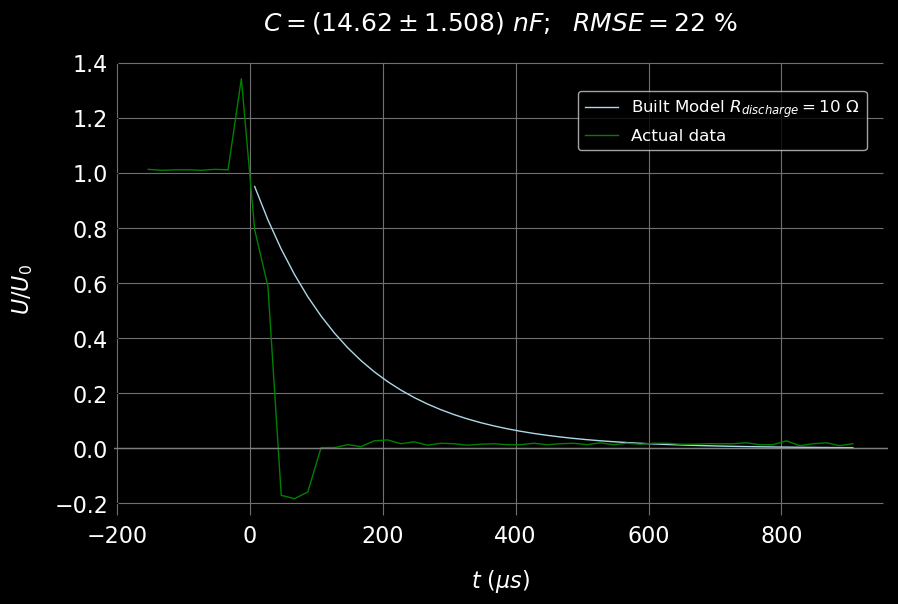

<IPython.core.display.Latex object>

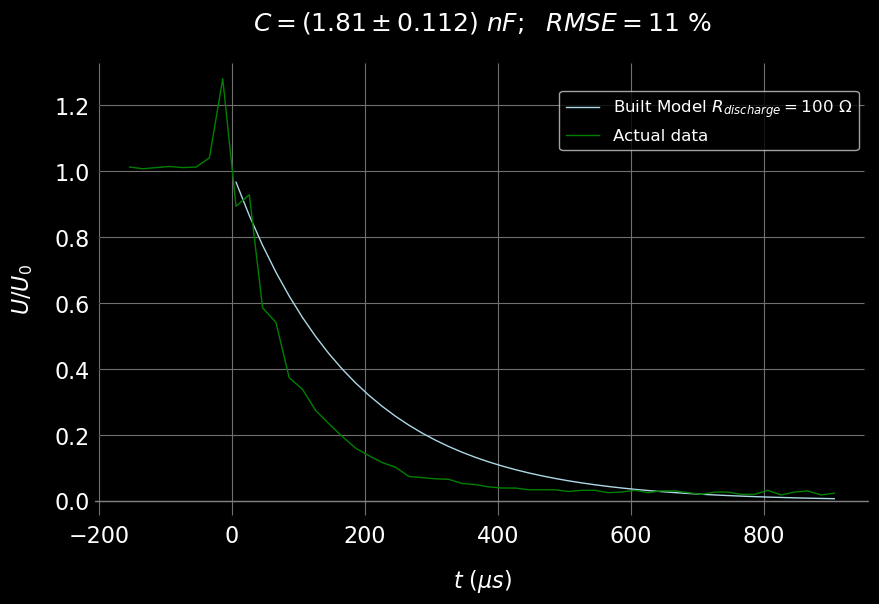

<IPython.core.display.Latex object>

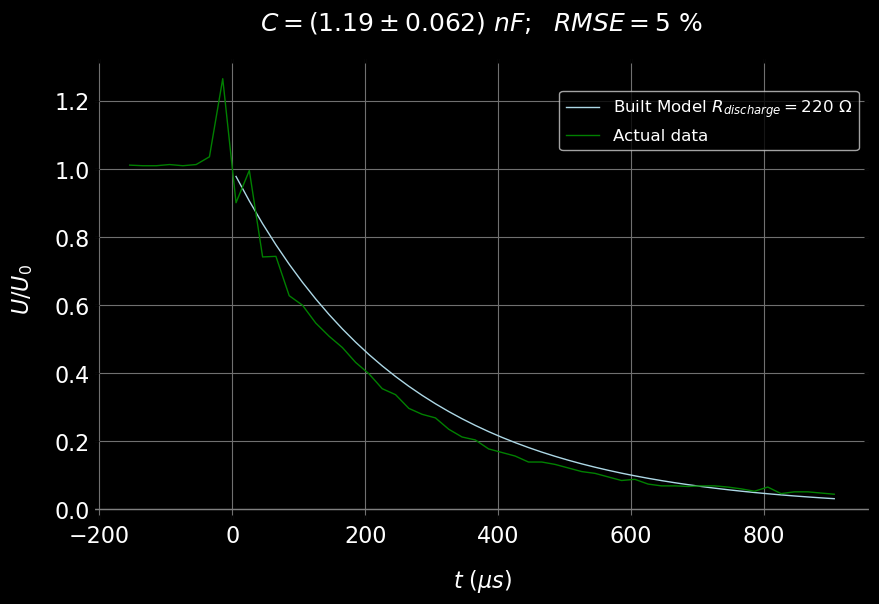

<IPython.core.display.Latex object>

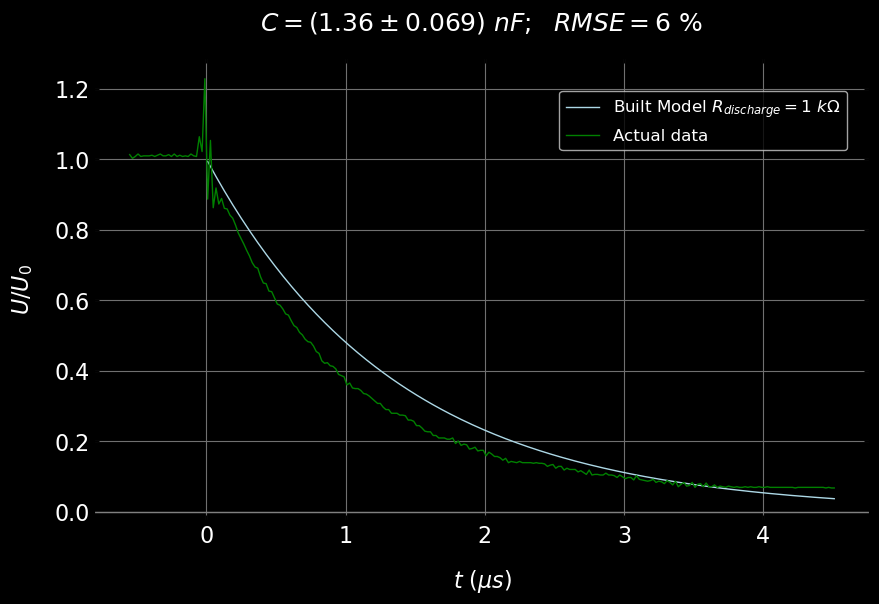

<IPython.core.display.Latex object>

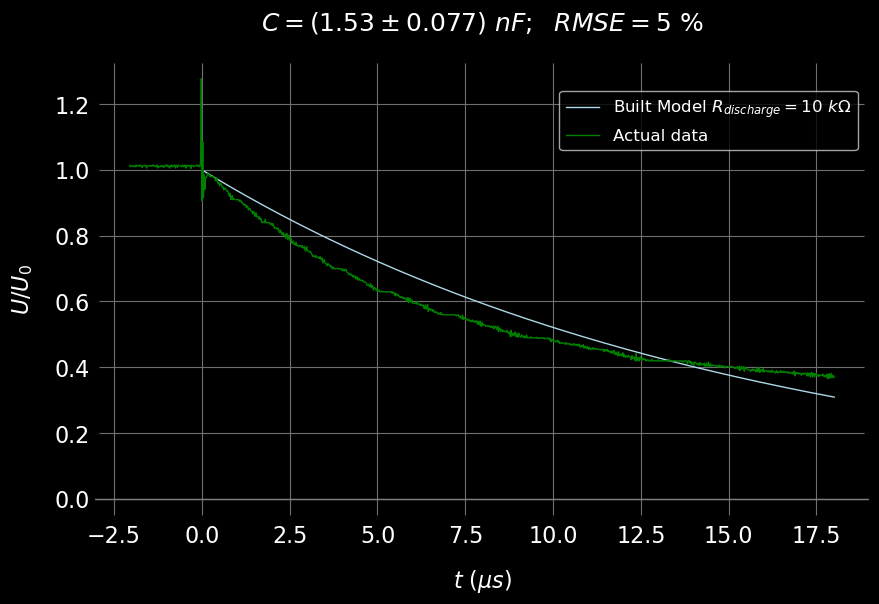

<IPython.core.display.Latex object>

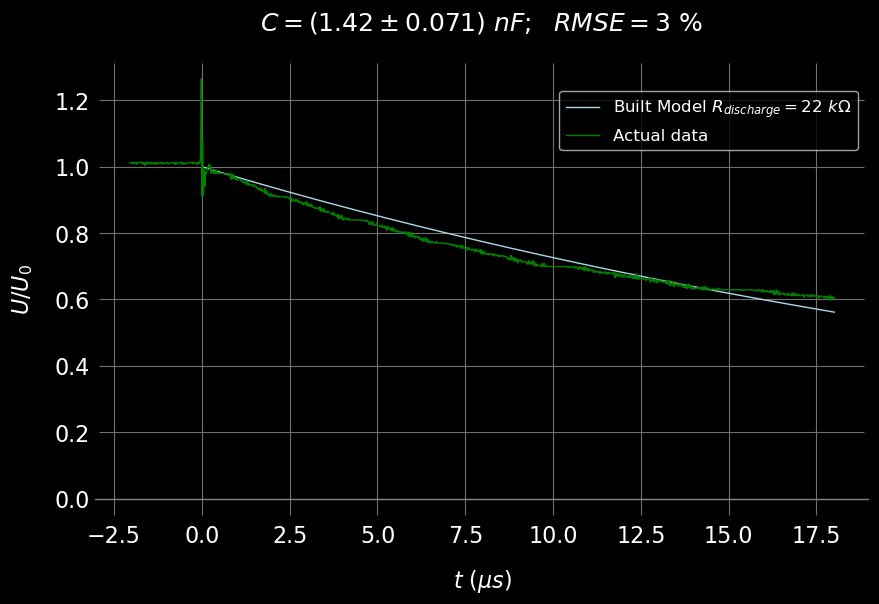

<IPython.core.display.Latex object>

In [7]:
model_l = []
C_l = []
u_C_l = []
u_R_l = np.array(R_l) * u_R_factor
RMSE_l = []
y_old_l = []
for i in range(len(R_l)):
    R = R_l[i]
    u_R = u_R_l[i]
    unit_factor = 1
    if(unit_mask[i] == 'us'): unit_factor = 1e3 # scaling to ns 
    t_i = avg_l[i][0]
    positive_index = np.where(t_i >= 0)[0][0]
    #############
    #positive_index = np.where(t_i >= 0)[0][0]
    #t_i = t_i[positive_index:]
    #######
    v_i = np.clip(avg_l[i][1], np.min(np.abs(avg_l[i][1])), None)
    #v_i = np.clip(avg_l[i][1][positive_index:], np.min(np.abs(avg_l[i][1][positive_index:])), None)
    y = np.log(v_i/U_0)
    y_plot = v_i/U_0
    model = curve_fit(fit_func, t_i, y)
    model_l.append(model)
    k = model[0][0]/unit_factor
    u_k = np.sqrt(model[1][0][0])/unit_factor
    C = -1/(R*k)
    u_C = np.sqrt((u_R/(k*R*R))**2+(u_k/(R*k*k))**2)
    C_l.append(C) # nF
    u_C_l.append(u_C) # nF
    y_est = U(t_i*unit_factor, R_l[i], C)
    y_old_l.append(y_est)
    RMSE = np.sqrt(np.sum((y_est[positive_index:]-y_plot[positive_index:])**2)/len(y_plot[positive_index:]))
    RMSE_l.append(RMSE)
    plt.plot(t_i[positive_index:], y_est[positive_index:], label=(r"Built Model $R_{discharge} = %d ~%s$" % (R_init_l[i], R_str_l[i] )), color='#ADD8E6')
    plt.plot(t_i, avg_l[i][1]/U_0, label="Actual data", color='green' )
    #plt.plot(t_i[positive_index:], np.abs(np.log(y_est[positive_index:])), label="Model")
    #plt.plot(t_i, np.abs(np.log(y_plot)), label="Test data")
    #plt.xlabel('$t$ ($%s$)' % unit_str)
    #plt.ylabel(r'$|\ln(\frac{U}{U_0})|$')
    plt.xlabel('$t$ ($%s$)' % unit_str)
    plt.ylabel('$U/U_0$')
    plt.grid(True)
    plt.axhline(0, color='grey')
    plt.title(r'$C = (%.2f \pm %.3f)~nF; ~~ RMSE = %.f ~%s  $' % (C, u_C, RMSE*1e2, '\%'))
    plt.legend(loc=(0.6,0.8))
    plt.show()
    dy(Lx(r'$Figure\, 2.%d$: Fitted model of $R_{discharge} = %d ~%s$ data.' % (i + 1, R_init_l[i], R_str_l[i])))
    #dy(Lx(r'$Figure\, 3.%d$: Linear fit of the data with $R = %d ~%s$.' % (i + 1, R_init_l[i], R_str_l[i])))
    #dy(Lx(r'$R = %.d ~%s \pm %.d ~ %s$ $$C = (%.2f \pm %.3f)~nF $$' % (R_init_l[i], R_str_l[i], 1e2*u_R_factor, '\%', C, u_C)))


In [8]:
best_index = np.argmin(np.array(RMSE_l))
C_best = C_l[best_index]
u_C_best = u_C_l[best_index]
dy(Lx("""Hence, one can observe from the figures above, that the model corresponding to $R = %.d ~%s \pm %.d ~ %s$ 
has the lowest error value with: $$C_{Best} = (%.2f \pm %.3f) ~nF$$""" % (R_init_l[best_index], R_str_l[best_index], 1e2*u_R_factor, '\%',C_best, u_C_best)))


<IPython.core.display.Latex object>

## Task3

### Test Model

***Task Definition*** 

The goal of task 3 is to test the accuracy of the best model from task 2.

***Theoretical Basis***

To test the accuracy of the best model, $C_{Best}=1.42nF$ was fixed and linear regression is applied for each set of measurements. 

It is hypothesized that the best model has a higher accuracy compared to the built models in task 2.

Validation occurs if the the best model's fitting error is less than the built model's for each set of measurements.

Additionally, this ensures the value of $R$ obtained via the best model is in agreement with the actual resistances used in the experiment. 

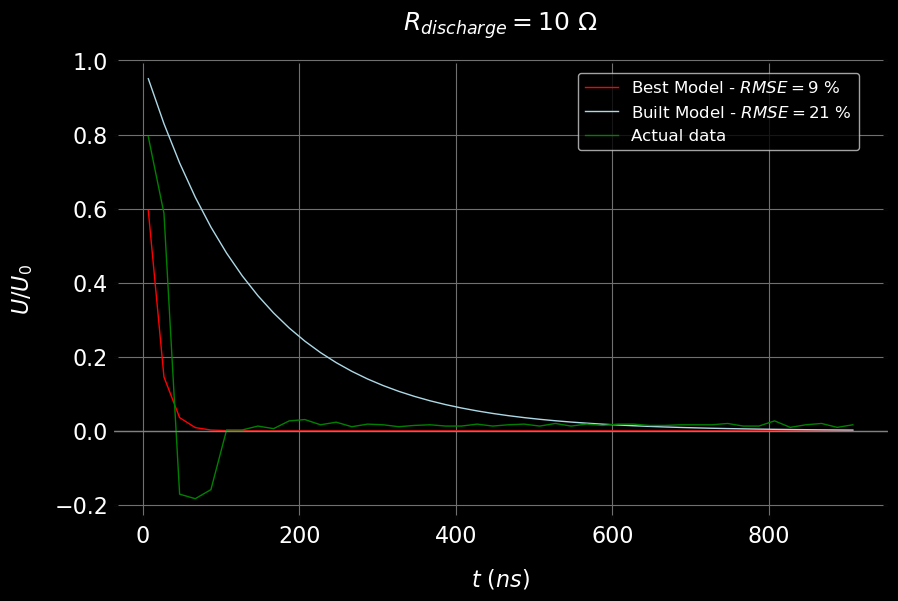

<IPython.core.display.Latex object>

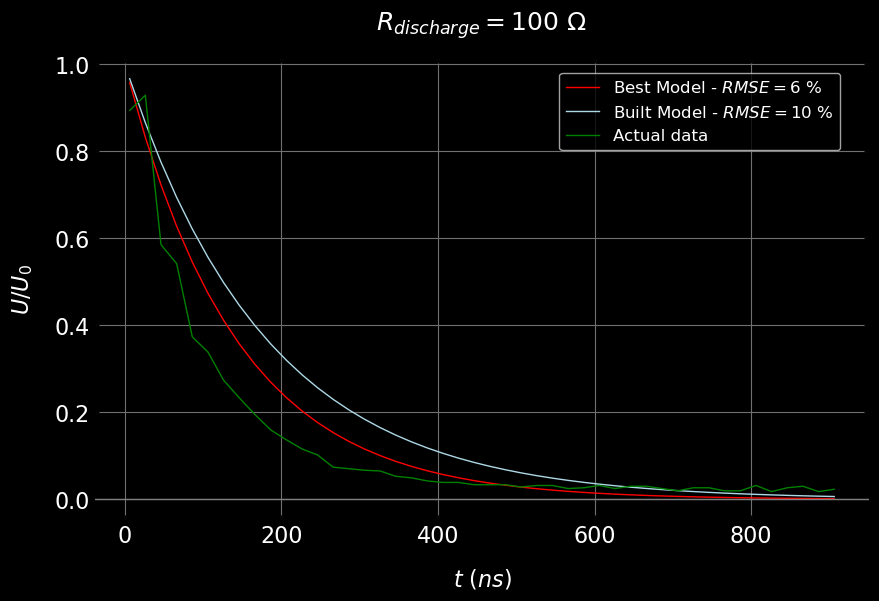

<IPython.core.display.Latex object>

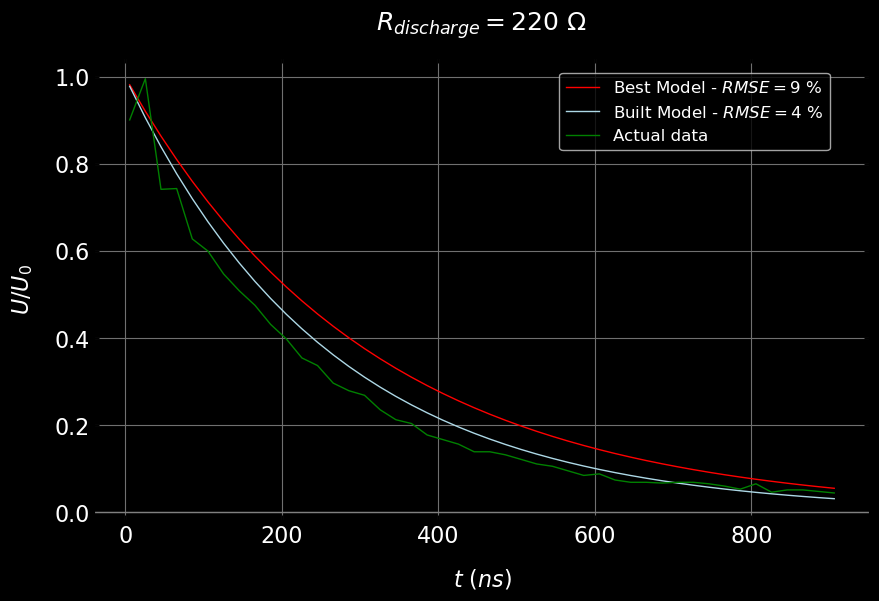

<IPython.core.display.Latex object>

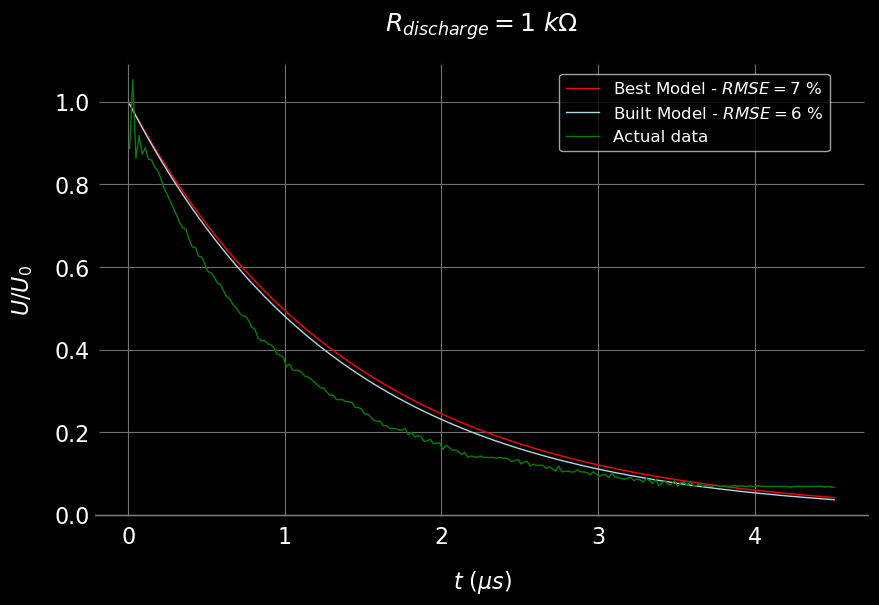

<IPython.core.display.Latex object>

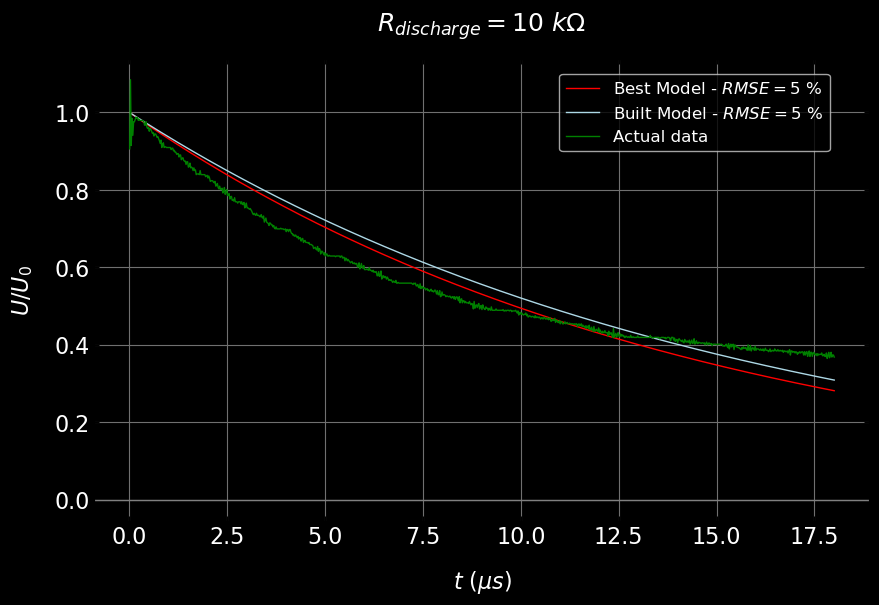

<IPython.core.display.Latex object>

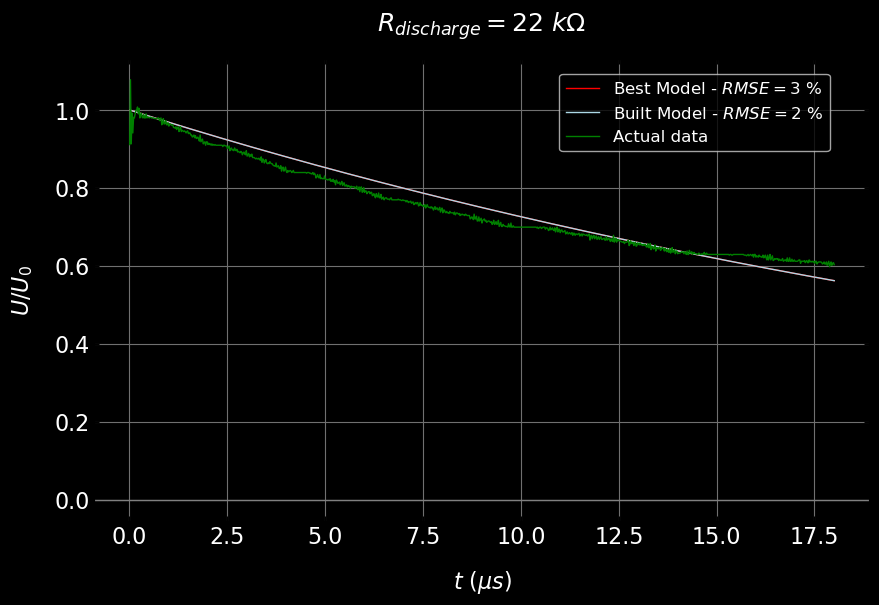

<IPython.core.display.Latex object>

In [9]:
R_model_l = []
u_R_model_l = []
RMSE_best_l=[]
for r_i in range(len(R_l)):   
    unit_factor = 1
    if(unit_mask[r_i] == 'us'): 
        unit_factor = 1e3 # scaling to ns 
        unit_str = '\\mu s'
    else:
        unit_str = 'ns'
    t_i = avg_l[r_i][0]
    positive_index = np.where(t_i >= 0)[0][0]
    t_plot = t_i[positive_index:]
    #t_plot = np.linspace(0, np.max(t_i))
    #y_plot = U(t_plot, R_l[r_i], C_best)
    y_best = U(t_plot*unit_factor, R_l[r_i], C_best)
    y_act = avg_l[r_i][1][positive_index:]/U_0
    RMSE = np.sqrt(np.sum((y_best-y_act)**2)/len(y_act))
    RMSE_best_l.append(RMSE)
    model = curve_fit(fit_func, t_plot, np.log(y_best))
    k = model[0][0]/unit_factor
    u_k = np.sqrt(model[1][0][0])/unit_factor
    R = -1/(C_best*k)
    u_R = np.sqrt((u_C_best/(k*C_best*C_best))**2+(u_k/(C_best*k*k))**2)
    R_model_l.append(R) # Ohm
    u_R_model_l.append(u_R) # Ohm
    #dy(Lx('$R = %.d ~%s \pm %.d ~ %s$ \t $C = (%.2f \pm %.3f)~nF$' % (R_init_l[r_i], R_str_l[r_i],  1e2*u_R_factor, '\%', C, u_C)))
    
    
    plt.plot(t_plot, y_best, label=(r"Best Model - $RMSE = %.f ~%s$" % (RMSE*1e2, '\%')), color='red')
    plt.plot(t_plot, y_old_l[r_i][positive_index:], label=(r"Built Model - $RMSE = %d ~%s$" % (RMSE_l[r_i]*1e2, '\%')), color='#ADD8E6')
    plt.plot(t_plot, y_act, label="Actual data", color='green')
    plt.xlabel('$t$ ($%s$)' % unit_str)
    plt.ylabel('$U/U_0$')
    plt.axhline(0, color='grey')
    plt.grid(True)
    plt.title(r'$R_{discharge} = %d ~%s$ ' % (R_init_l[r_i], R_str_l[r_i]))
    plt.legend(loc=(0.6,0.8))
    plt.show()
    dy(Lx(r'$Figure\, 3.%d$: Comparison of Best model with Built model ($R_{discharge} = %d ~%s$).' % (r_i + 1, R_init_l[r_i], R_str_l[r_i])))


***Analysis***

The hypothesis proposed is validated for all values of $R_{discharge}$ except when it is equal to $220 ~ \Omega$. This abnormal result is unexpected and requires further investigation.

## Task 4

### Compare Time Constant ($\tau$)

**Task Definition** 

The goal of task 4 is to calculate and compare the time constant $\tau$ for the best model.

***Theoretical Basis***

The time constant $\tau$ is the amount of time needed for a discharging capacitor to reach $36.8$ %  of its maximum voltage.

$$ \tau = R_{discharge} C \label{eq4.1} \tag{4.1}$$

- $R_{discharge} = 22 k\Omega$
- $C_{best} = 1.42nF$

The capacitor in our best model is unable to fully discharge because $R_{charge} = R_{discharge}$. 

Instead, the capacitor is only able to reach a minimum value of $U_c = \frac{U_0}{2}$

This is mathematically captured by modifying Eq [1.1](#mjx-eqn-eq1.1) to account for the offset yielding:

$$ U_c = \frac{U_0}{2} \exp \left( -\frac{t}{RC} \right) + \frac{U_0}{2} \label{eq4.2} \tag{4.2}$$

- $U_0 = 5V$

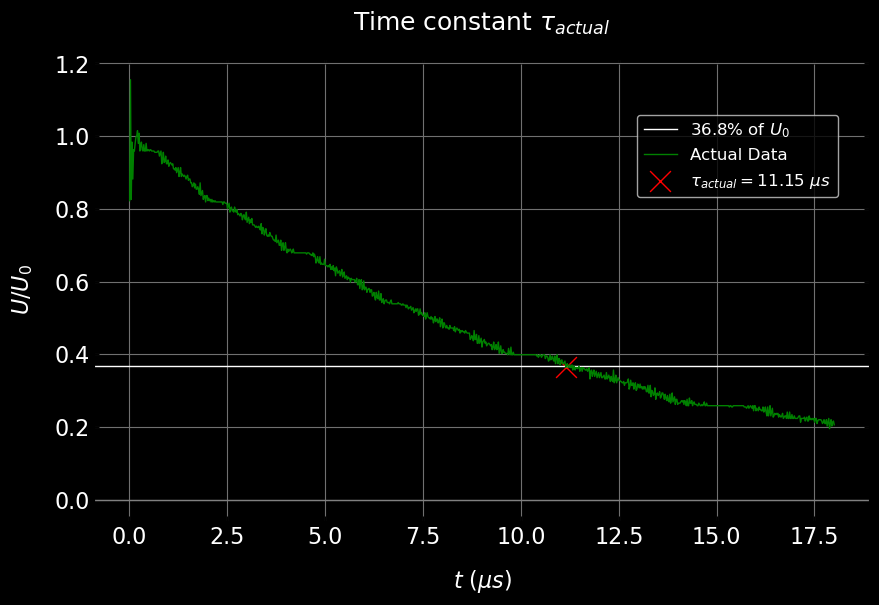

<IPython.core.display.Latex object>

In [10]:
unit_factor = 1
if(unit_mask[best_index] == 'us'):
    unit_factor = 1e3 # scaling to ns 
    unit_str = '\\mu s'
else:
    unit_str = 'ns'
t_i = avg_l[best_index][0]
y_act = 2*avg_l[best_index][1][positive_index:]/U_0 - 1
positive_index = np.where(t_i >= 0)[0][0]
t_plot = t_i[positive_index:]
#model = curve_fit(fit_func, t_plot, np.log(y_act))
#k = model[0][0]/unit_factor
#u_k = np.sqrt(model[1][0][0])/unit_factor
#R = -1/(C_best*k)
#u_R = np.sqrt((u_C_best/(k*C_best*C_best))**2+(u_k/(C_best*k*k))**2)
y_est = 2*U(t_plot*unit_factor, R_l[best_index], C_best) - 1

tau_index = np.argwhere(y_act <= 36.8/100)[0][0]
tau_est_index = np.argwhere(y_est <= 36.8/100)[0][0]
tau_act = R_l[best_index] * C_best / unit_factor
#tau_est = R * C_best / unit_factor
#plt.axvline(tau_act)
#plt.axvline(tau_est)
#print(tau_act)
plt.axhline(36.8/100, label=r'$36.8\%$ of $U_0$', color = 'white')
plt.axhline(0, color='grey')
#RMSE = np.sqrt(np.sum((y_est-y_act)**2)/len(y_act))
#RMSE_l.append(RMSE)

#R_model_l.append(R) # Ohm
#u_R_model_l.append(u_R) # Ohm
#dy(Lx('$R = %.d ~%s \pm %.d ~ %s$ \t $C = (%.2f \pm %.3f)~nF$' % (R_init_l[r_i], R_str_l[r_i],  1e2*u_R_factor, '\%', C, u_C)))

#plt.plot(t_plot, y_est, label="Best Model", color='r')
plt.plot(t_plot, y_act, label="Actual Data", color='g')
#plt.scatter(t_plot[tau_est_index], y_est[tau_est_index], color = 'r', marker = 'x', label=(r'$\tau_{model} = %.2f ~%s$' % (t_plot[tau_est_index], unit_str)))
plt.scatter(t_plot[tau_index], y_act[tau_index], color = 'r', marker = 'x', label=(r'$\tau_{actual} = %.2f ~%s$' % (t_plot[tau_index], unit_str)))
plt.xlabel('$t$ ($%s$)' % unit_str)
plt.ylabel('$U/U_0$')
plt.grid(True)
plt.title(r'Time constant $\tau_{actual}$')
plt.legend(loc=(0.7,0.7))
plt.show()
dy(Lx(r'$Figure\, 4.%d$: Determining $\tau_{actual}$. ($R_{discharge} = %d ~%s$).' % (1, R_init_l[best_index], R_str_l[best_index])))

***Analysis***

1- Using $C_{best}$ and Eq [4.1](#mjx-eqn-eq4.1), the theoretical value of $\tau$ was determined to be $\tau_{Theory}=31.2 \mu s$

2- Using the measurement data of $R_{discharge} = 22k \Omega$ and Eq [4.2](#mjx-eqn-eq4.1), the actual value of $\tau$ was determined be $\tau_{actual}= 11.15 \mu s$ 

3- This significant discrepency between the actual and theoretical values of $\tau$ is likely caused by using Eq [1.1](#mjx-eqn-eq1.1) as the fitting equation instead of Eq [4.2](#mjx-eqn-eq4.1). Hence, the mentioned offset was never considered when building the best model.